In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os


module_path = os.path.abspath(os.path.join(os.getcwd(), '..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import plot_config as pc
import ml_functions as ml

pc.apply_custom_mpl_settings()

2025-12-17 10:48:04.909397: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<h1><span style="color:orange">Numerical Simulation Laboratory (NSL)</span></h1>

<h2><span style="color:blue"> Keras - Neural Network regression</span></h2>

<h2><span style="color:green">Numerical Exercise 11</span></h2>

The primary objective of this notebook is to gain familiarity with the design and implementation of Deep Neural Networks (DNNs) to address regression problems. Currently, there is no comprehensive theoretical framework that provides deterministic guidelines for establishing the optimal model architecture a priori. Consequently, we must rely on an **empirical and heuristic approach**: constructing various models by tuning their hyperparameters and complexity, and subsequently comparing their performance in solving the target regression task.

The notebook is organized into the following six sections:

1. [Introduction to Machine Learning and Neural Networks](#intro)

2. [Definition of the analysis problem](#predition-problem)

3. [Brief description of the implementation](#implementation)

4. Analysis of model performance as a function of network parameters and complexity, applied to the [linear fitting of a real-valued function](#linear-fit) $f(x) = 2x + 1$ con $x \in [-1; 1]$ (in this notebook).

5. Analysis of model performance as a function of network parameters and complexity, applied to the fitting of a polynomial function $f(x) = 3x^3 -2x^2 -3x + 4$ con $x \in [-1; 1]$ (in notebook `LSN_Notebook_11_2.ipynb`).

6. Analysis of model performance as a function of network parameters and complexity, applied to the fitting of a 2D trigonometric function $f(x_1, x_2) = \sin(x_1^2 + x_2^2)$ con $x_1 \in [-3/2;3/2]$ e $x_2 \in [-3/2;3/2]$ (in notebook `LSN_Notebook_11_3.ipynb`). 

<a id="intro"></a>

<h2><span style="color:darkviolet">Machine Learning, Regression Problems and Feed-Forward Neural Networks (FFNNs)</span></h2>

The term Machine Learning (ML) denotes a vast subfield within Artificial Intelligence (AI) dedicated to developing algorithms that enable automatic data learning. Deep Neural Networks (DNNs) have emerged as the primary tool to achieve this goal. Unlike traditional programming, ML is based on a distinct paradigm where the computer does not execute a program to produce outputs from inputs. Instead, based on a dataset (comprising inputs and outputs, or just inputs), the system constructs a predictive model which can then be used to make forecasts on new, unseen input data.

Machine Learning is generally categorized into three broad paradigms, based on the structure of the underlying learning process:

- **Supervised Learning (SL)**: A learning model where the input dataset is complete, possessing both the features (input data) $\mathbf{x}$ and the corresponding labels (output data) $\mathbf{y}$. The objective is to produce a model that generates output predictions $\hat{\mathbf{y}}$ for new, unlabeled input values $\mathbf{x}$. SL is primarily used to address two classes of problems:
    
    - **Regression**: The label produced is a continuous real number (e.g., fitting a function unknown a priori).
    
    - **Classification**: The label produced is a discrete category (e.g., image recognition).

- **Unsupervised Learning (UL)**: A learning model where the input dataset contains features $\mathbf{x}$ without associated labels $\mathbf{y}$. The objective is to simultaneously generate both a model and the meaningful labels (or underlying structure). UL is primarily used for:

    - **Clustering**

    - **Association**

    - **Generative Modelling**

- **Reinforcement Learning (RL)**: A learning model where an agent or algorithm learns the correct behavior by interacting directly with its environment. The agent receives rewards or penalties based on the outcome of its actions, which subsequently modify its objective function (loss). The agent's goal is to minimize this loss by maximizing cumulative rewards. RL relies on a combination of elements from dynamic programming, control theory, and Markov Decision Processes (MDPs). It is typically applied to teach machines to perform sequential decision-making tasks, such as playing games.

This notebook focuses on applying **Supervised Learning** to three distinct regression problems. Supervised Learning fundamentally relies on three core elements:

1. **Dataset** ($\mathbb{D}$): The dataset $\mathbb{D} = \{(\mathbf{x}_i, \mathbf{y}_i)\}_{i=1}^{N}$ consists of pairs of values: **features** $\mathbf{x} \in \mathcal{X} \subset \mathbb{R}^p$ and **labels** $\mathbf{y} \in \mathcal{Y} \subset \mathbb{R}^q$. During the learning phase, the dataset is partitioned into a **training set** (typically 80-90%) and a **test/validation set**. The model is trained exclusively on the training set, and its generalization capability is subsequently evaluated by testing it on the unseen test set. This separation is crucial to ensure an unbiased assessment of the model's performance.

2. **Model** ($\hat{f}_{\mathbf{p}}$): The model is the output of the computational process. It is a function $\hat{f}_{\mathbf{p}} : \mathbf{x} \to \mathbf{y}$, parameterized by the vector $\mathbf{p}$ (weights and biases), which is capable of making predictions $\hat{\mathbf{y}} = \hat{f}(\mathbf{x};\mathbf{p})$ given input features $\mathbf{x}$.

3. **Cost/Loss Function** ($\mathcal{C}$): The Cost or Loss function $\mathcal{C}\left[\mathbf{y};\hat{f}\left(\mathbf{x};\mathbf{p}\right)\right]$ is a scalar measure that quantifies the discrepancy between the model's predictions $\hat{\mathbf{y}}$ and the true labels $\mathbf{y}$. The learning process minimizes this function to determine the optimal parameter vector $\mathbf{p}$. For regression problems, the most widely used Cost Function is the **Mean Squared Error (MSE)**, while for classification problems, **Cross-Entropy (XE)** is typically employed.

We define:

- **In-sample error/Training error** ($\varepsilon_{in}$): The cost function calculated on the training data: $\varepsilon_{in} = \mathcal{C}\left[\mathbf{y}_{train};\hat{f}\left(\mathbf{x}_{train};\mathbf{p}\right)\right]$.

**Out-of-sample error/Generalization error** ($\varepsilon_{out}$): The cost function calculated on the test/validation data: $\varepsilon_{out} = \mathcal{C}\left[\mathbf{y}_{test};\hat{f}\left(\mathbf{x}_{test};\mathbf{p}\right)\right]$.

The comparison between these two errors is known as the **cross-validation procedure**. Generally, $\varepsilon_{in} \le \varepsilon_{out}$ because the training error can be reduced to a negligible value by tuning the parameters to fit the training data perfectly. Conversely, the out-of-sample error is calculated on unseen data, making it a more robust measure of the model's true performance.

The discipline concerning the relationship between these error types is **Statistical Learning Theory (SLT)**. According to SLT, the behavior of the training and generalization errors can be analyzed by varying two main factors: the size of the dataset ($N$) and the complexity of the model.

- **Error vs. Dataset Size** ($N$): The training error $\varepsilon_{in}$, after an initial drop, generally tends to increase or stabilize as the dataset size $N$ grows, saturating towards a value often associated with the inherent **Bias** of the model (representing the model's inability to perfectly describe the true underlying process). The generalization error $\varepsilon_{out}$, however, decreases monotonically as $N$ increases, as more data allows the model to learn the true function structure more accurately.
    - For a fixed model, the difference between $\varepsilon_{out}$ and the ideal bias is often associated with the **Variance**.
    - The difference between $\varepsilon_{out}$ and $\varepsilon_{in}$ is an indicator of **Overfitting** (if large).

- **Error vs. Model Complexity (Degrees of Freedom)**: Complexity is often measured by the total number of parameters in the model.
    - **Bias** decreases as complexity increases (a more complex model has a higher capacity to approximate intricate functions).
    - **Variance** increases as complexity increases. If a model fits the training data too closely, it captures both the underlying function and the noise inherent in the training samples. This results in **poor generalization** to new data points.
    - The generalization error $\varepsilon_{out}$, via the **Bias-Variance Trade-off** ($\varepsilon_{out} \approx \text{Bias} + \text{Variance}$), is minimized at an optimal model complexity. This optimum is the point where the model is expressive enough to capture the function's signal but simple enough to avoid fitting the training noise.

<div style="text-align: center;">
<img src="images/bias_variance.jpg" alt="Error vs complexity" width="600">
</div>

In the last decade, **Neural Networks (NNs)** have emerged as one of the most powerful and widely used supervised learning techniques. They can be broadly classified into categories based on their architecture and application:

1. **General purpose NNs**: Such as Feed-Forward Neural Networks (FFNNs) for supervised learning tasks.

2. **NNs for Image Processing**: Convolutional Neural Networks (CNNs).

3. **NNs for Sequential Data**: Recurrent Neural Networks (RNNs).

4. **NNs for Unsupervised Learning**: Deep Belief Networks (DBMs).

The general goal of NNs is to computationally replicate the function of the nervous system, whose fundamental logical unit is the biological neuron.

<div style="text-align: center;">
<img src="images/neurons.jpeg" alt="Biological Neuron" width="600">
</div>

The earliest artificial neuron, the **Perceptron**, is a logical unit that processes inputs via linear algebraic operations and produces a binary output (0 or 1) based on whether the result exceeds a certain threshold. The Perceptron's activation function is thus a **Heaviside step function** ($\Theta$). Since small variations in input parameters can drastically alter the output of a Perceptron, more robust and continuous alternatives were developed. The **Sigmoid Neuron** was the first, utilizing a continuous, differentiable approximation of the step function:

$$\sigma(z) = \frac{1}{1 + e^{-z}} \quad \text{where} \quad z = \mathbf{w} \cdot \mathbf{x} + w_0 \underset{x_0 = 1}{=} \sum_{i=0}^{N}w_ix_i.$$

In addition to the sigmoid, numerous other **non-linear activation functions** are used today. The non-linearity of these functions is crucial, as it allows the network to learn and represent complex, non-linear relationships in the data.

<div style="text-align: center;">
<img src="images/activation_functions.jpg" alt="Activation Functions" width="600">
</div>

A neural network is formed by a succession of interconnected layers of neurons.

- The initial layer is the **Input Layer**, whose neuron count is determined by the input dimensionality ($p$).

- The final layer is the **Output Layer**, whose neuron count is determined by the output dimensionality ($q$) and the nature of the problem (e.g., one neuron for regression).

- All layers situated between the Input and Output layers are called **Hidden Layers**. The number and size of these hidden layers dictate the model's overall capacity.

The expressive power of NNs is underpinned by the **Universal Approximation Theorems (UATs)**:

1. **Shallow UAT**: A Feed-Forward Network with a single hidden layer and a non-polynomial activation function can approximate any continuous function on compact subsets of $\mathbb{R}^n$ with arbitrary accuracy, provided enough neurons are used.

2. **Deep UAT (e.g., for ReLU)**: Deep networks (those with multiple hidden layers) can approximate certain functions exponentially more efficiently than shallow networks, requiring fewer parameters to achieve the same approximation quality.

The learning phase of a neural network is quantified by the concept of an **Epoch**. An epoch represents one complete pass of the entire training dataset through the learning algorithm. During an epoch, the training dataset is typically split into smaller **mini-batches**. For each mini-batch, an approximate gradient of the loss function is calculated (usually via **Stochastic Gradient Descent** or a variant like **Adam**), and the parameters are updated in the direction that minimizes the loss.

The key question is: **How many epochs should be performed**?

There is no pre-defined number. The appropriate stopping condition is provided by the **Early Stopping Point method**. This criterion dictates that training should be halted at the point where the **validation error** ($\varepsilon_{out}$) **ceases to decrease and begins to increase**.

- Stopping before this point indicates **Underfitting** (the model has not learned the training data well enough).

- Continuing after this point leads to **Overfitting** (the model has started to fit the noise in the training data, leading to a poorer generalization error).

<div style="text-align: center;">
<img src="images/early_stopping_point.jpg" alt="Early Stopping Point" width="600">
</div>

<a id="prediction-problem"></a>

<h2><span style="color:darkviolet">Prediction Problem</span></h2>

We consider a probabilistic process that generates labeled data $(\mathbf{x}, y)$. The data points are constructed by drawing samples from the equation:

$$y_i= f(\mathbf{x}_i) + \eta_i,$$

where $f(\mathbf{x}_i)$ represents the fixed, underlying function (the **True Function** or **True Signal**), and $\eta_i$ is an independent and identically distributed (i.i.d.) Gaussian noise variable characterized by:

$$\langle \eta_i \rangle = 0 \\
\langle \eta_i \eta_j \rangle = \delta_{ij} \sigma^2.$$

Here, $\sigma^2$ is the variance of the noise. The term $f(\mathbf{x}_i)$ represents the noise-free output used to generate the data.

To make predictions, we employ a Neural Network (NN) model, $\hat{f}(\mathbf{x};\mathbf{p})$, which is parameterized by its weights and biases $\mathbf{p}$. The set of all functions that the NN can model defines the **hypothesis space** or **model class** used to approximate the data distribution and generate predictions.

To optimize the parameters of the NN, we train our models on a dedicated **Training Dataset**. We then evaluate the model's effectiveness on a separate, unseen **Test Dataset**. This division into training and test sets is fundamental to Machine Learning, as the ultimate objective is to ensure the model exhibits strong **generalization capability** (the ability to make accurate predictions on new data it has never encountered).

To quantify the predictive performance of our algorithm, we compare the model's predictions, $\{\hat{y}_j\}$, to the actual observed noisy values $\{y_j\}$ in the test set. A standard measure employed for this regression task is the **Mean Squared Error (MSE)** on the test set:

$$\text{MSE}= \frac{1}{N_{\text{test}}}\sum_{j=1}^{N_{\text{test}}} (\hat{y}_j - y_j)^2.$$

Throughout this analysis, we will gain a **qualitative understanding** of model performance by examining plots comparing the model fit against the true function and analyzing the learning curves (training and test error) across epochs.

<a id="implementation"></a>

<h2><span style="color:darkviolet">Implementation</span></h2>

The entire codebase is implemented using TensorFlow's **Keras** API, a high-level library designed for the straightforward and efficient construction of Deep Neural Networks (DNNs).

Our strategic approach involves conducting a **single-variable sensitivity analysis**: we systematically explore the effects of varying one hyperparameter at a time on the model's generalization error (validation loss), while keeping all other parameters fixed. At each step, we train several models, observe the qualitative trends in the resulting plots, and identify the configuration that yields the best performance.

To streamline this process, we have implemented several wrapper functions, contained within the utility file `../ml_functions.py`, which encapsulate the core analysis steps:

##### Core Utility Functions

- `generate_dataset_regression()`: This function is responsible for creating the synthetic dataset required for training and testing. It takes the following key arguments:
    
    - The total number of samples (n_data). The dataset is then split internally into a **training set** (used for optimization) and a **test/validation set** (used for generalization assessment, typically 80% and 20% respectively, or as specified in the function body).

    - The dimensionality of the input feature space and the output label space (`input_dim`, `output_dim`), ensuring the setup is generalizable to multi-dimensional regression problems.

    - The defined range/interval for the input features (`input_min`, `input_max`).
    
    - The analytical function ($\mathbf{f}$) that the model is intended to fit (the **True Function**).
    
    - The standard deviation ($\sigma$) of the Gaussian noise applied to the true labels, simulating real-world data imperfections.

- `generate_network_regression()`: This function defines and compiles the fundamental architecture of the Neural Network. Its arguments include:

    - The dimensionality of the feature and label spaces (`input_dim`, `output_dim`) to correctly configure the input and output layers.

    - A list specifying the number of neurons in each hidden layer, implicitly defining the network's depth (`hidden_neurons`).
    
    - The optimization algorithm used to minimize the cost function (`optimizer`).
    
    - The non-linear function applied within the hidden layers (`act_func`).
    
    - The loss function used to quantify error during training and validation (`loss`).
    
    - Any additional control metrics monitored during training (`metrics`).


- `model_optimization_regression()`: This function handles the training process of the compiled model. It accepts:

    - The training and validation datasets.

    - The maximum number of training passes (`epochs`).

    - The size of the data mini-batches (`batch_size`).

    - It internally utilizes **Early Stopping** and **Learning Rate Reduction** callbacks to prevent overfitting and accelerate convergence, respectively <span style="color:red">(implemented but not used to evaluate performances as function of epochs)</span>.

- `evaluate_model()`: This function quantitatively assesses the trained model's performance. It calculates both the generalization error on the noisy test data and, critically, a **Diagnostic MSE** by comparing the predictions against the true, noise-free labels ($\mathbf{y}_{\text{true}}$). The arguments are:

    - The compiled and trained Keras model.
    
    - The test dataset (features and noisy labels).
    
    - The size of the batches used for evaluation.

These core functions are supplemented by a set of dedicated plotting routines designed to visualize the learning history, the final 1D fits, and the 3D surface fits, allowing for a clear qualitative comparison between different model configurations.

<a id="linear-fit"></a>

<h2><span style="color:darkviolet">Exercise 11.1: Linear Fit $f(x) = 2x + 1$</span></h2>

The primary goal of this exercise is to qualitatively study the model's performance on a simple linear regression task, $f(x) = 2x + 1$, as a function of various key hyperparameters. We will use a minimal architecture (no hidden layers, effectively a standard linear fit) as the baseline, varying one parameter at a time. Performance is assessed based on the **Validation Loss** (MSE vs noisy test data, $\varepsilon_{\text{out}}$) and the **Diagnostic MSE** (MSE vs the true, noise-free labels, $\varepsilon_{\text{true}}$).

The true function parameters are defined as: $m = 2.0, q = 1.0$.

In [2]:
m = 2.0
q = 1.0

def f_true(x):
    return m*x + q

### 1. Influence of Dataset Size ($N$)

We first analyze how the model's performance is affected by the total number of data points ($N$), keeping the noise level and training parameters fixed ($\sigma=0.5$, $\text{epochs}=100$). The baseline model uses no hidden layers (Linear Regression).

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


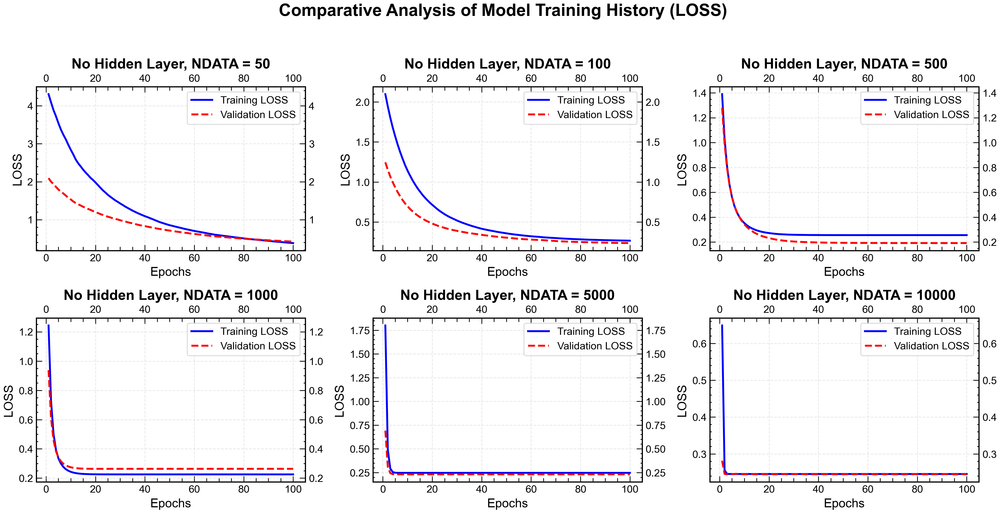

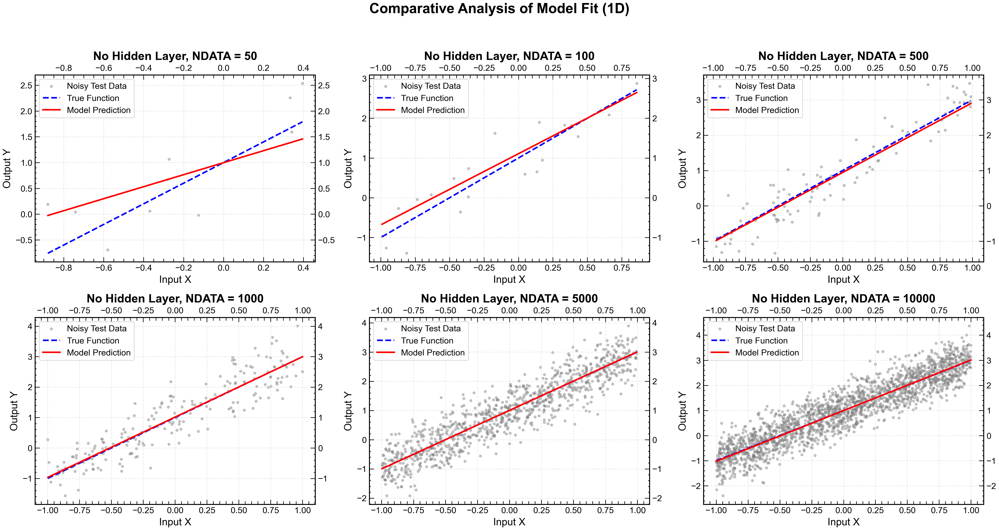

In [3]:
model_list = []
history_list = []
x_test_list, y_test_list, y_true_test_list, y_pred_list = [], [], [], []
titles_list = []
mse_test_ndata, mse_true_ndata = [], []

n_datas = [50, 100, 500, 1000, 5000, 10000]
x_min, x_max, sigma, n_epoch = -1.0, 1.0, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = []
act_func, optimizer, loss, metrics = 'relu', 'sgd', 'mse', 'mae'

for n in(n_datas):

    title = f"No Hidden Layer, NDATA = {n}"
    titles_list.append(title)

    x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n, f_true, sigma, seed=0)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    x_test_list.append(x_test)
    y_test_list.append(y_test)
    y_true_test_list.append(y_true_test)
    y_pred_list.append(y_pred)
    mse_test_ndata.append(results['loss'])
    mse_true_ndata.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test_list, y_test_list, y_true_test_list, y_pred_list, titles_list)

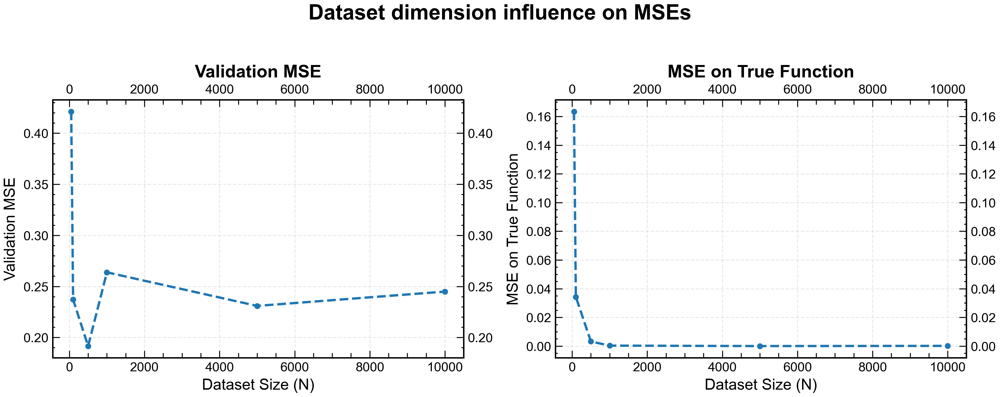

In [4]:
ml.plot_compare(n_datas, mse_test_ndata, mse_true_ndata, 'Dataset dimension influence on MSEs', 'n_data')

#### Discussion on the Influence of Dataset Size ($N$)

1. High Variability in Small Datasets ($N \le 100$): The model exhibits high variance. The Diagnostic MSE (vs $Y_{\text{true}}$) shows significant deviation, indicating that the limited number of samples prevents the model from statistically isolating the signal $f(x)$ from the noise $\eta_i$. 

2. Convergence and Reduced Variance ($N$ increases): As $N$ increases ($N > 500$), the Diagnostic MSE rapidly decreases, demonstrating improved approximation of the true underlying function.

3. Performance Saturation: Beyond $N \approx 1000$ total samples, both the Validation Loss and the Diagnostic MSE stabilize, showing minimal further improvement.

Given the stabilization of the error metrics, we select **$N=1000$** total samples for subsequent experiments, balancing accuracy and computational efficiency.

### 2. Influence of Noise Level ($\sigma$)

With the dataset size fixed at $N=1000$, we now examine the effect of the standard deviation of the Gaussian noise ($\sigma$) on model performance.

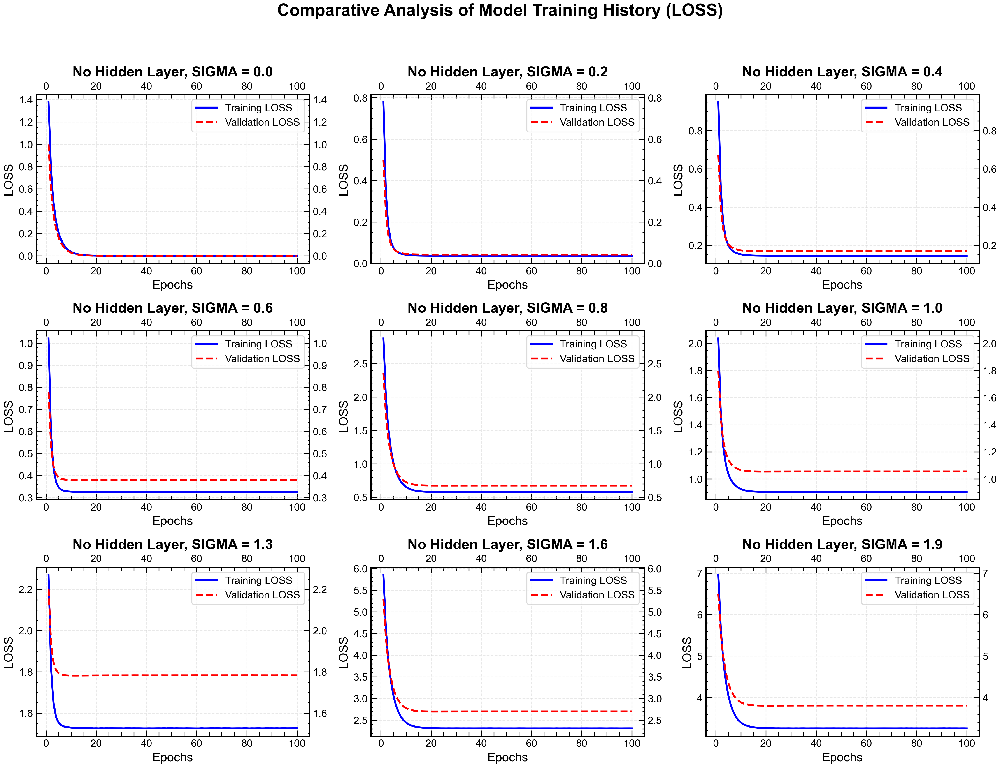

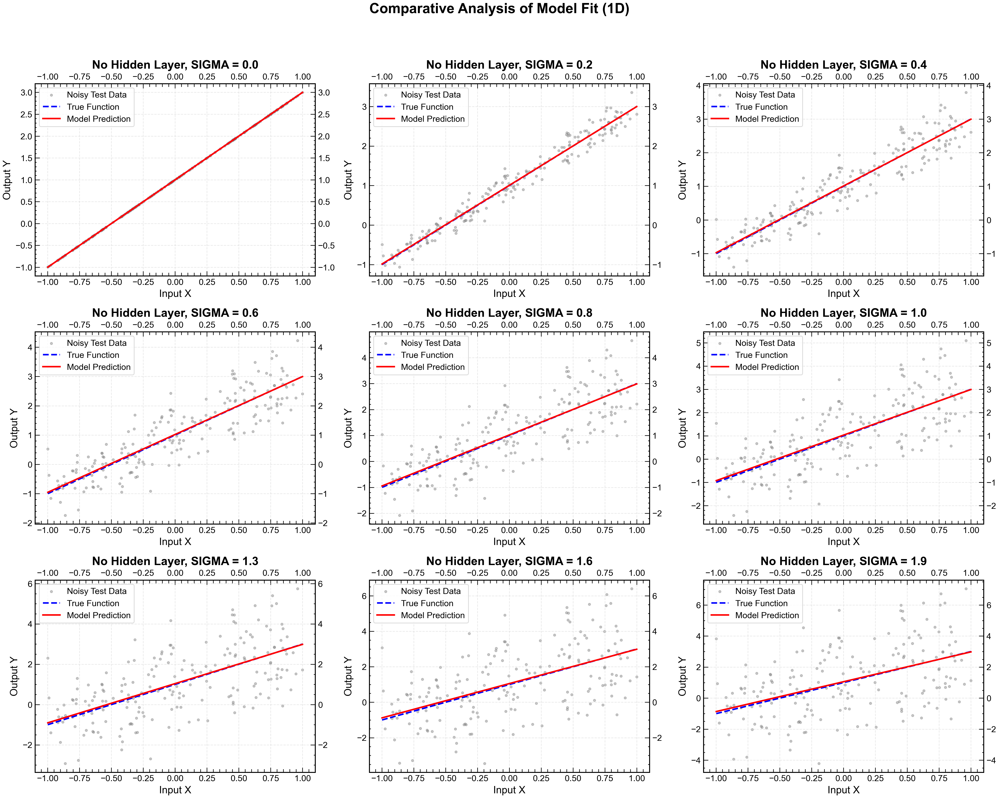

In [5]:
model_list = []
history_list = []
x_test_list, y_test_list, y_true_test_list, y_pred_list = [], [], [], []
titles_list = []
mse_test_sigma, mse_true_sigma = [], []

sigmas = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.3, 1.6, 1.9]
x_min, x_max, n_data, n_epoch = -1.0, 1.0, 1000, 100
input_dim, output_dim = 1, 1
hidden_neurons = []
act_func, optimizer, loss, metrics = 'relu', 'sgd', 'mse', 'mae'

for s in(sigmas):

    title = f"No Hidden Layer, SIGMA = {s}"
    titles_list.append(title)

    x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, s)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    x_test_list.append(x_test)
    y_test_list.append(y_test)
    y_true_test_list.append(y_true_test)
    y_pred_list.append(y_pred)
    mse_test_sigma.append(results['loss'])
    mse_true_sigma.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test_list, y_test_list, y_true_test_list, y_pred_list, titles_list)

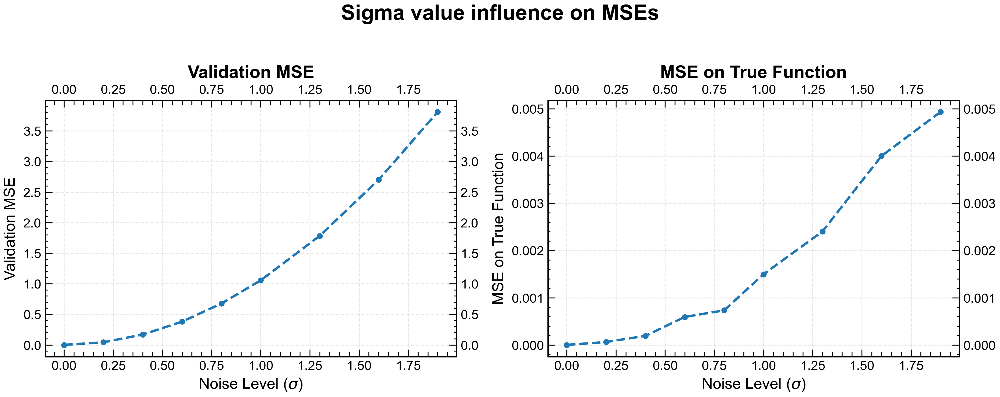

In [6]:
ml.plot_compare(sigmas, mse_test_sigma, mse_true_sigma, 'Sigma value influence on MSEs', 'sigma')

#### Discussion on the Influence of Noise Level ($\sigma$)

The plots clearly show that increased Gaussian noise in both the training and test data leads to a corresponding increase in both the Validation MSE and the Diagnostic MSE. This reflects the increased difficulty in isolating the true underlying signal from the random perturbations.

A critical observation concerns the relationship between the errors and $\sigma$:

- **Validation MSE ($\varepsilon_{\text{out}}$ vs $Y_{\text{noisy}}$)**: The error increases approximately quadratically with the dispersion ($\sigma$) of the dataset ($MSE \propto \sigma^2$). This aligns with the definition of the **irreducible error** in regression problems: the minimum achievable MSE is equal to the variance of the noise ($\sigma^2$), which is the fundamental limit of prediction accuracy regardless of the model complexity.

- **Diagnostic MSE ($\varepsilon_{\text{true}}$ vs $Y_{\text{true}}$)**: This error, while remaining low, also increases with $\sigma$, reflecting the small loss in the model's fitting accuracy due to the added difficulty of the optimization task in noisy conditions.

To maintain a manageable loss value for subsequent comparative analysis and avoid results overwhelmingly dominated by high irreducible error, we choose to continue the analysis using a noise level of $\sigma = 0.5$.

### 3. Influence of Training Epochs ($N_{\text{epochs}}$)

We now investigate the necessary number of training epochs to ensure the **Stochastic Gradient Descent (SGD)** optimizer fully converges for the chosen fixed parameters ($N=1000$, $\sigma=0.5$).

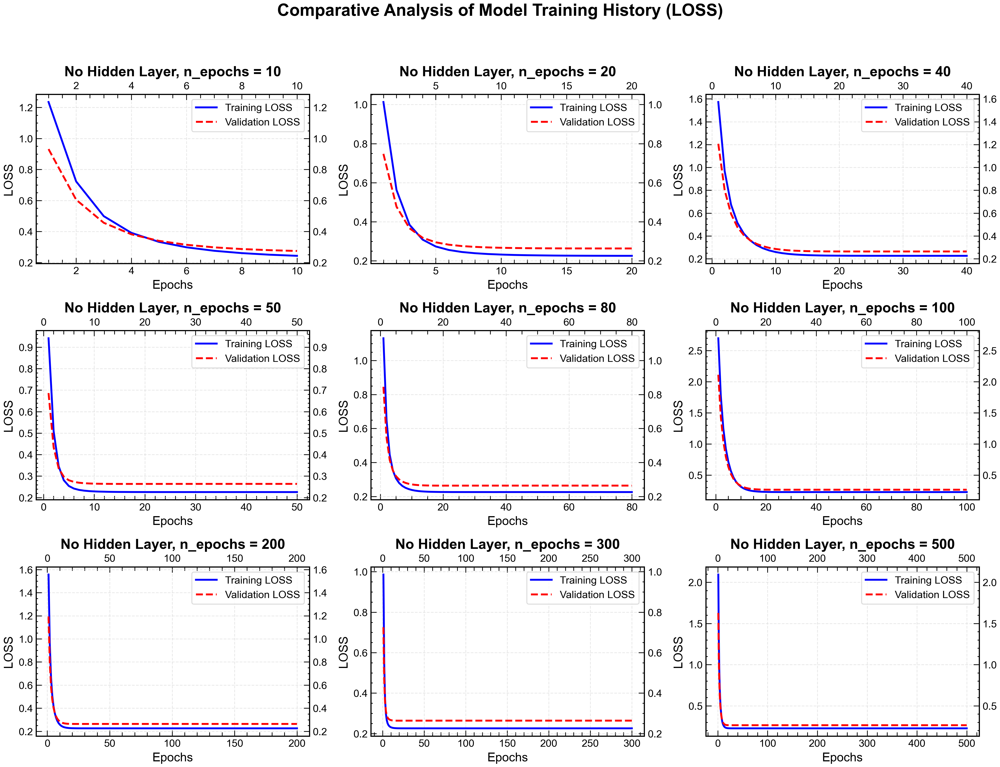

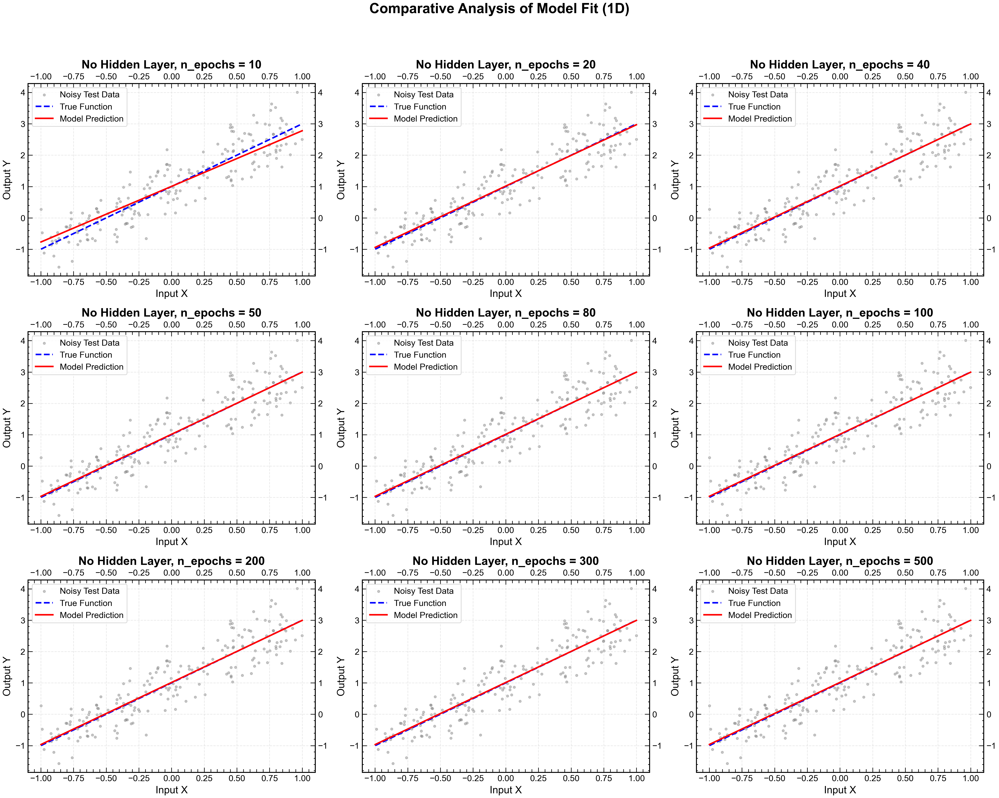

In [7]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_nepochs, mse_true_nepochs = [], []

n_epochs = [10, 20, 40, 50, 80, 100, 200, 300, 500]
x_min, x_max, n_data, sigma = -1.0, 1.0, 1000, 0.5
input_dim, output_dim = 1, 1
hidden_neurons = []
act_func, optimizer, loss, metrics = 'relu', 'sgd', 'mse', 'mae'

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for e in(n_epochs):

    title = f"No Hidden Layer, n_epochs = {e}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=e, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_nepochs.append(results['loss'])
    mse_true_nepochs.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

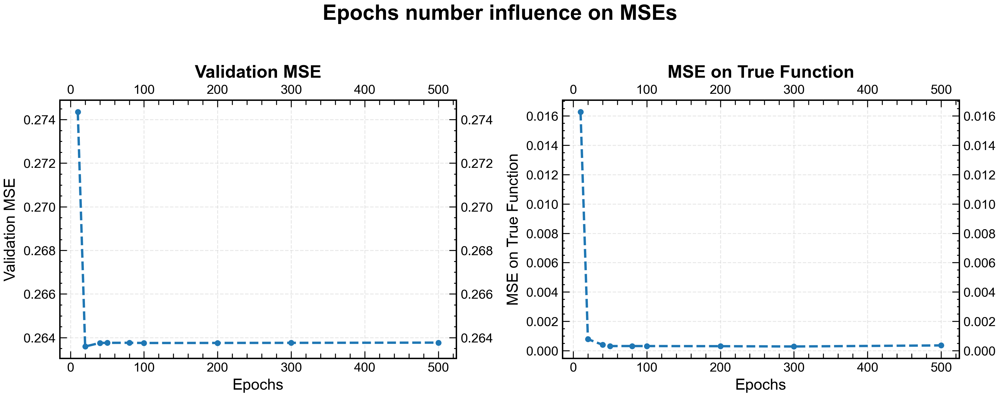

In [8]:
ml.plot_compare(n_epochs, mse_test_nepochs, mse_true_nepochs, 'Epochs number influence on MSEs', 'epochs')

#### Discussion on the Influence of Training Epochs

The analysis shows that for the simple linear model minimized using the **Stochastic Gradient Descent (SGD)** optimizer:

- Convergence is incomplete for epoch counts below $\approx 80$, where the cost function has not yet reached its minimum.

- Beyond $80$ epochs, the cost function is effectively minimized, as indicated by the plateau in the Validation MSE.

We select $100$ **epochs** as the standard duration for convergence for SGD-based models. However, for the subsequent analysis comparing different optimization algorithms, we will temporarily increase the maximum epoch count to $500$. This longer duration is necessary to provide a fair comparison, accommodating optimizers (like Adam or Adagrad) which often have inherently different and potentially slower convergence rates in this specific simple problem setting.

### 4. Influence of Optimization Algorithm (Optimizer)

Using the optimized epoch count ($500$) and the fixed parameters ($N=1000, \sigma=0.5$), we compare the performance of various gradient-based optimization algorithms.

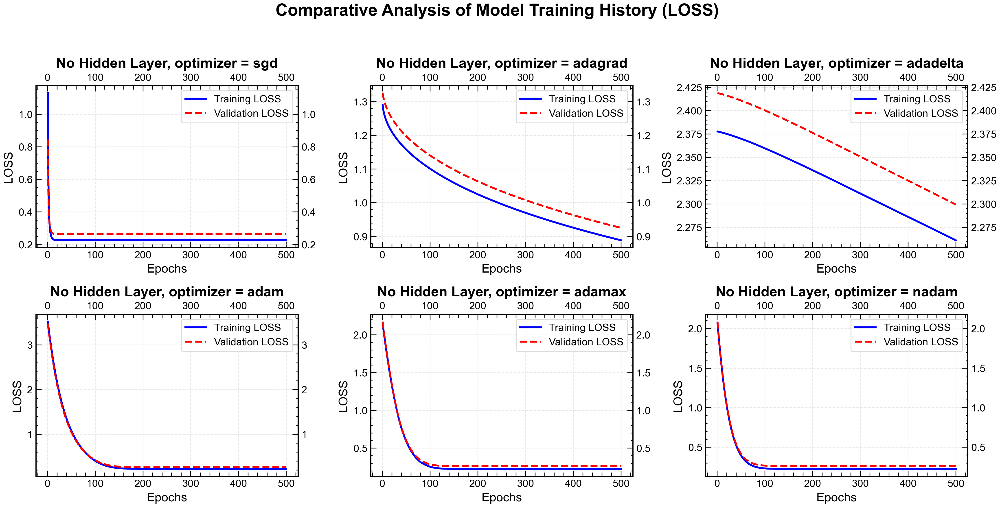

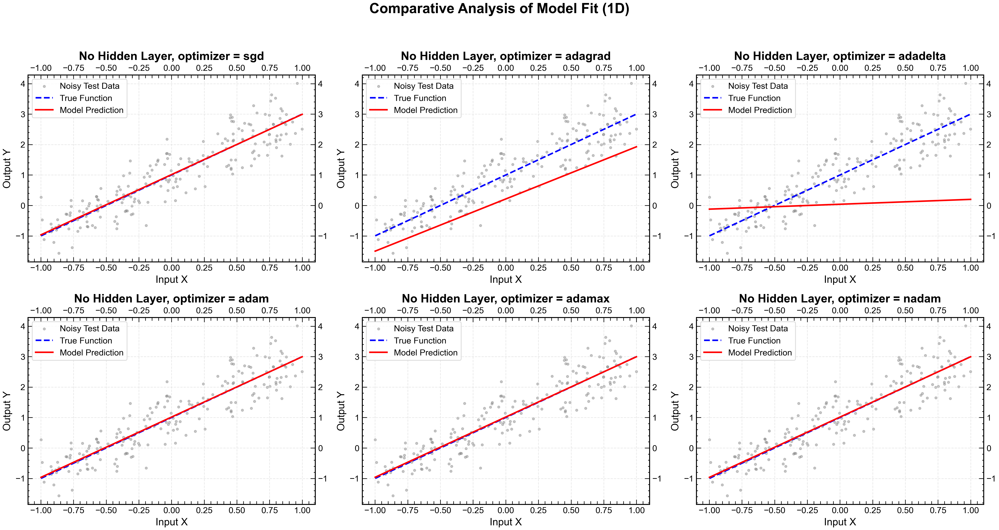

In [9]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_optimizer, mse_true_optimizer = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 1000, 0.5, 500
input_dim, output_dim = 1, 1
hidden_neurons = []
act_func, loss, metrics = 'relu', 'mse', 'mae'
optimizers = ['sgd', 'adagrad', 'adadelta', 'adam', 'adamax', 'nadam']

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for o in(optimizers):

    title = f"No Hidden Layer, optimizer = {o}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=o, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_optimizer.append(results['loss'])
    mse_true_optimizer.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

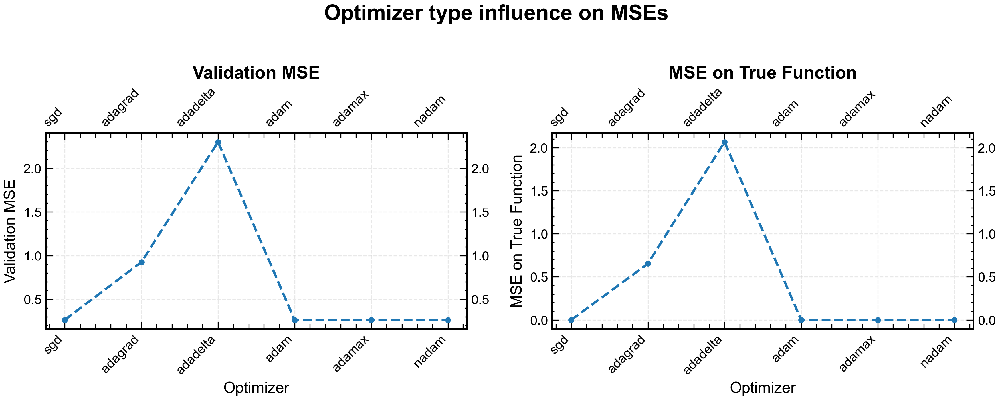

In [10]:
ml.plot_compare(optimizers, mse_test_optimizer, mse_true_optimizer, 'Optimizer type influence on MSEs', 'optimizer')

#### Discussion on the Influence of Optimization Algorithm

The analysis reveals two distinct groups of optimizers:

- **Successful Convergers (Low MSE)**: SGD, Adam, Adamax and Nadam successfully minimize the cost function, producing predictions compatible with the linear target function. The quality of the final solution (final MSE values) is highly similar across this group, as expected when the model capacity is perfectly matched to the problem.

- **Poor Convergers (High MSE)**: Adagrad and Adadelta failed to reach the optimal solution within the $500$ epoch limit. This is visible from their high Validation MSE values and the corresponding poor fit in the 1D plots.

Regarding the successful group, convergence speed is the key differentiator:

- SGD demonstrated the fastest convergence rate, achieving minimization between $50$ and $80$ epochs.

- Adamax and Nadam converged more slowly, typically requiring $100$ epochs to reach a satisfactory solution.

- Adam has the slower convergence, requiring around $200$ epochs to reach a satisfactory solution.

Due to its superior convergence speed for this simple linear task, **SGD** is selected as the primary optimizer for the remaining analysis, reverting to the standard $100$ **epochs** training limit established previously.

### 5. Influence of Activation Function (Non-Linear Model Test)

To test the effect of the activation function, we must first introduce hidden layers (`[5, 5]`), forcing the model into a Deep Neural Network architecture. We then compare various non-linear activations against the linear activation function.

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


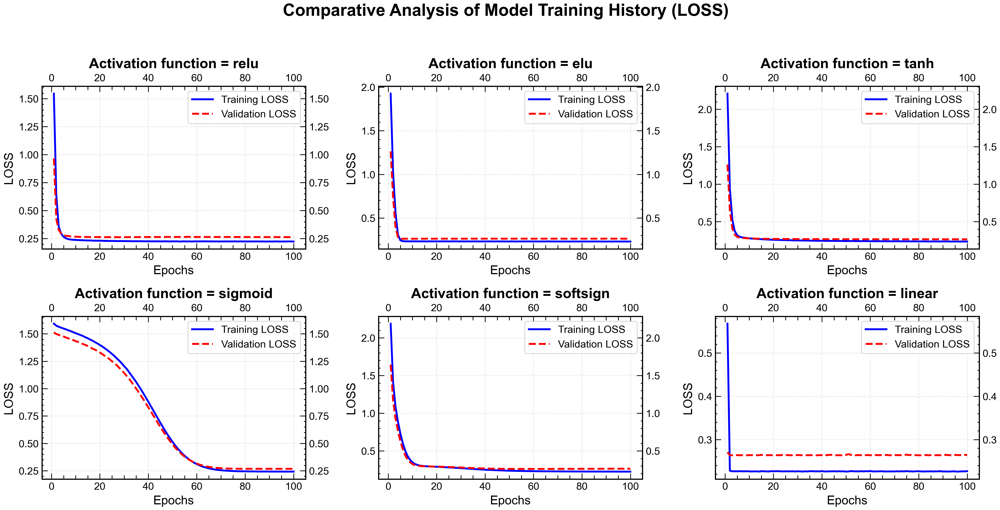

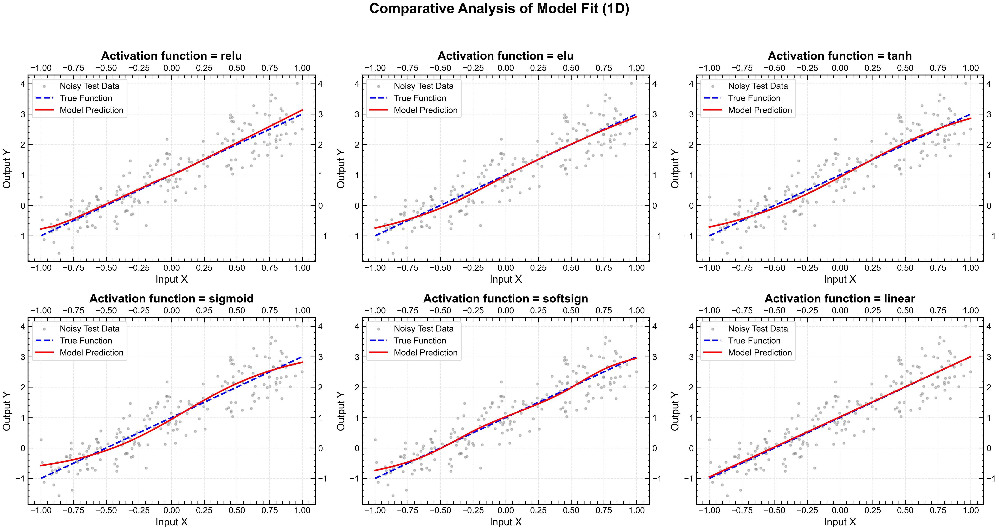

In [11]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_act_funcs, mse_true_act_funcs = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 1000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [5,5]
optimizer, loss, metrics = 'sgd', 'mse', 'mae'
act_funcs = ['relu', 'elu', 'tanh', 'sigmoid', 'softsign', 'linear']

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for actf in(act_funcs):

    title = f"Activation function = {actf}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=actf, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_act_funcs.append(results['loss'])
    mse_true_act_funcs.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

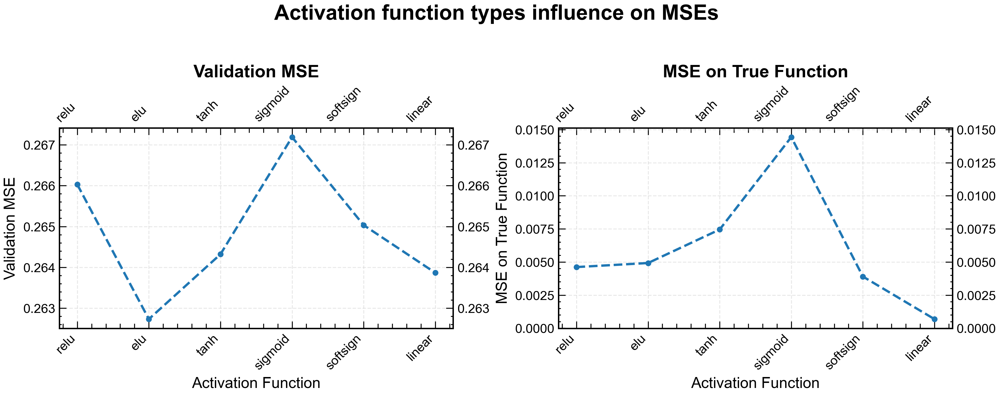

In [12]:
ml.plot_compare(act_funcs, mse_test_act_funcs, mse_true_act_funcs, 'Activation function types influence on MSEs', 'activation function')

#### Discussion on the Influence of Activation Function

The results demonstrate that the **Linear activation function** yields the most accurate fit to the linear target function $f(x) = 2x + 1$ but it does not provide the lowest MSE.

The use of non-linear activation functions (like ReLU, Tanh, Sigmoid) introduces unnecessary non-linearity, forcing the model to approximate a straight line using piecewise linear segments or sigmoid curves, which complicates the optimization process and can slightly degrade the final accuracy (as seen in the slightly elevated MSE values for non-linear models).

When fitting a linear function, the optimal model architecture is one that propagates linear relationships. Therefore, the Linear activation function is optimal, confirming the necessity of matching model capacity to the underlying function complexity.

### 6. Influence of Network Architecture (Depth and Width)

Finally, we return to the optimal **Linear activation function** and analyze the effect of increasing the depth (number of hidden layers) and width (neuron count fixed at 5 per layer) on performance.

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


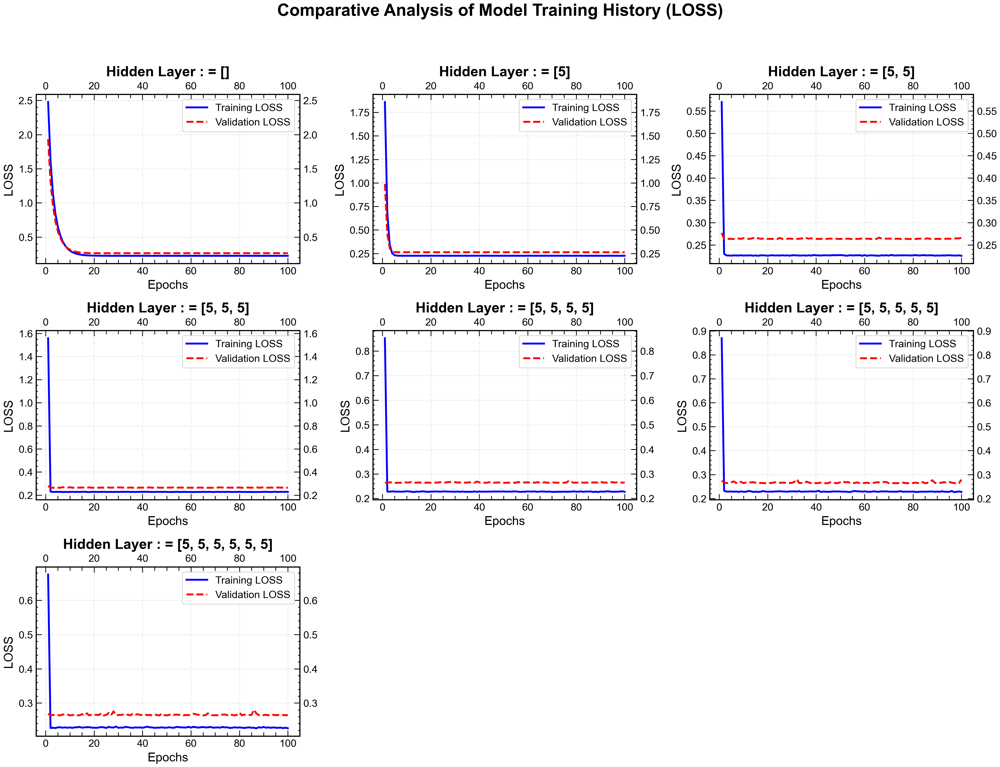

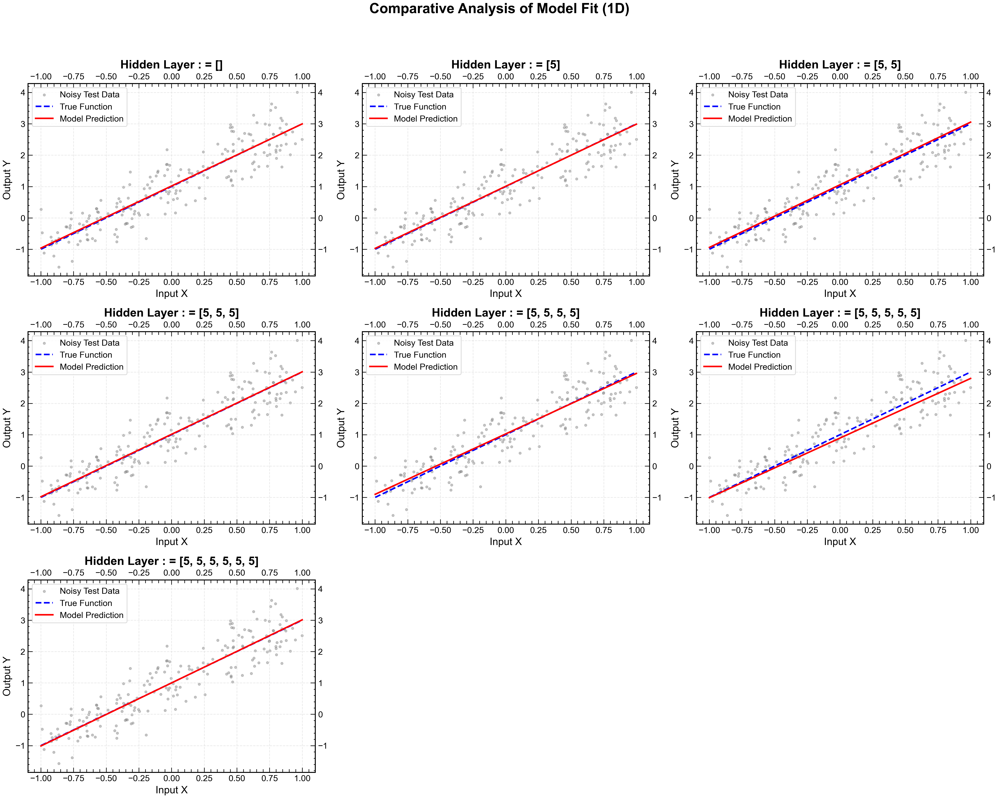

In [13]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_layers, mse_true_layers = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 1000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [[], [5], [5,5], [5,5,5], [5,5,5,5], [5,5,5,5,5], [5,5,5,5,5,5]]
act_func, optimizer, loss, metrics = 'linear', 'sgd', 'mse', 'mae'

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for n in(hidden_neurons):

    title = f"Hidden Layer : = {n}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=n, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_layers.append(results['loss'])
    mse_true_layers.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

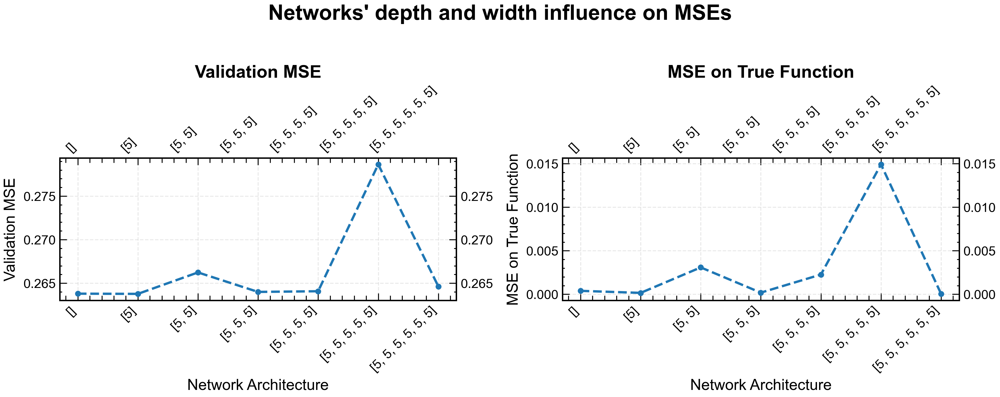

In [14]:
ml.plot_compare(hidden_neurons, mse_test_layers, mse_true_layers, 'Networks\' depth and width influence on MSEs', 'layers')

#### Discussion on the Influence of Network Architecture

The results clearly indicate that the optimal model is the one with **zero hidden layers** (a simple linear regressor). This outcome is supported by a fundamental mathematical consideration: the composition of multiple affine (linear) transformations remains a single affine transformation. That is, applying a linear activation function across multiple hidden layers does not increase the expressive capacity of the network beyond that of a single-layer linear model.

The addition of deeper hidden layers with linear activations does not improve the model's ability to reproduce the dataset faithfully. In fact, increasing the depth ($5-6$ layers) slightly degrades performance (higher Validation MSE). This degradation can be attributed to:

- **Increased Parameter Count**: Adding unnecessary parameters increases the risk of instability during optimization.

- **Optimization Difficulty**: While mathematically equivalent, deeper networks are inherently more complex to optimize numerically, leading to slightly worse convergence within the fixed epoch count.

### Conclusions

For the linear regression task $f(x) = 2x+1$, the optimal model architecture is the one with the lowest complexity: **zero hidden layers** (a single-layer linear model), trained with the **SGD optimizer** for approximately $100$ **epochs** on a dataset of at least $N=1000$ **samples**, thereby minimizing model variance and computational resources.